In [4]:
# import libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.io import loadmat
import torch
from torchvision import models, transforms
import timm
from PIL import Image

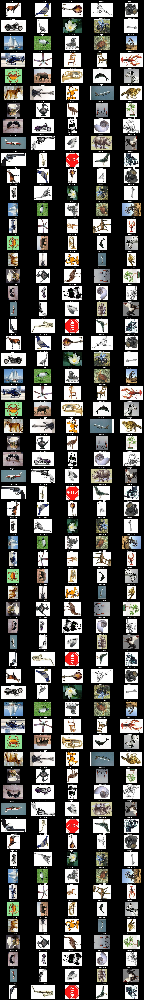

In [5]:
# load stimuli
stimuli = loadmat('natural_stim_50_rotated_90.mat')['stim']

# display the stimuli
fig, ax = plt.subplots(60, 5, figsize=(20, 140))
for i, img_arr in enumerate(stimuli):
    ax[i//5, i%5].imshow(img_arr[0], cmap='gray')
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_title(f'Image {i+1}')
plt.show()


In [6]:
print(stimuli.shape)
print(stimuli[0].shape) 
print(stimuli[0][0].shape)

(300, 1)
(1,)
(277, 300, 3)


In [7]:
def calculateMirrorConfusionIndex(original, horizontal, vertical):
    original = original.view(original.size(0), -1)
    horizontal = horizontal.view(horizontal.size(0), -1)
    vertical = vertical.view(vertical.size(0), -1)
    d_h = torch.norm(original - horizontal, dim=None)
    d_v = torch.norm(original - vertical, dim=None)
    mirror_confusion_index = (d_h - d_v) / (d_h + d_v)
    return mirror_confusion_index

# VGG16

In [7]:
vgg16 = models.vgg16(pretrained=True)
vgg16.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg16.to(device)

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

vgg16_embeddings = []
num_images = stimuli.shape[0]
vgg16Features = vgg16.features
vgg16AvgPool = vgg16.avgpool
vgg16Linear = vgg16.classifier
for i in range(num_images):
    vgg16_embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)

    with torch.no_grad():
        for layer in vgg16Features:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)

            if isinstance(layer, torch.nn.Conv2d):
                confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
                vgg16_embeddings[-1].append(confusion_index)

        original_tensor = torch.flatten(vgg16AvgPool(original_tensor))
        horizontal_tensor = torch.flatten(vgg16AvgPool(horizontal_tensor))
        vertical_tensor = torch.flatten(vgg16AvgPool(vertical_tensor))

        for layer in vgg16Linear:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)

            if isinstance(layer, torch.nn.Linear):
                confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
                vgg16_embeddings[-1].append(confusion_index)

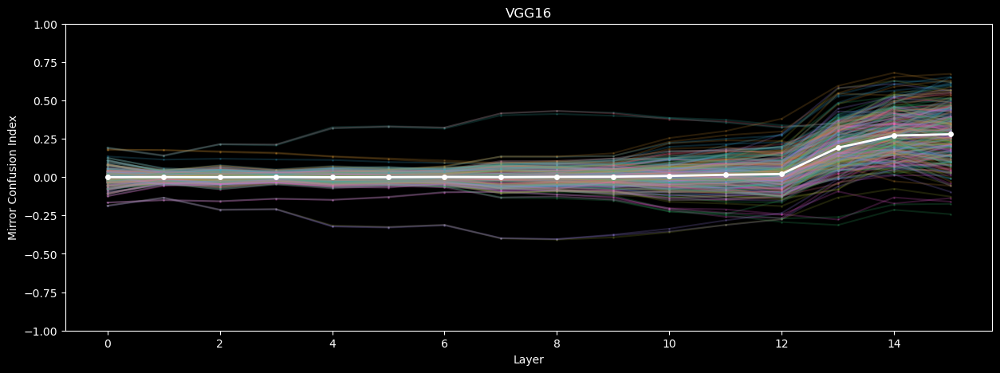

In [8]:
np_vgg16_embeddings = [[e.item() for e in img] for img in vgg16_embeddings]
np_vgg16_mean = np.mean(np_vgg16_embeddings, axis=0)
plt.figure(figsize=(15, 5))
for i in range(num_images):
    color = sns.color_palette("husl", 8)[i % 8] + (0.2,)
    plt.plot(np_vgg16_embeddings[i], color=color, marker='o', markersize=1)
plt.plot(np_vgg16_mean, color='white', marker='o', markersize=4, linewidth=2)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('VGG16')
plt.show()

In [9]:
rand_vgg16 = models.vgg16(pretrained=False)
rand_vgg16.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
rand_vgg16.to(device)

rand_vgg16_embeddings = []
num_images = stimuli.shape[0]
rand_vgg16Features = rand_vgg16.features
rand_vgg16AvgPool = rand_vgg16.avgpool
rand_vgg16Linear = rand_vgg16.classifier

for i in range(num_images):
    rand_vgg16_embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)

    with torch.no_grad():
        for layer in rand_vgg16Features:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)

            if isinstance(layer, torch.nn.Conv2d):
                confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
                rand_vgg16_embeddings[-1].append(confusion_index)

        original_tensor = torch.flatten(rand_vgg16AvgPool(original_tensor))
        horizontal_tensor = torch.flatten(rand_vgg16AvgPool(horizontal_tensor))
        vertical_tensor = torch.flatten(rand_vgg16AvgPool(vertical_tensor))

        for layer in rand_vgg16Linear:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)

            if isinstance(layer, torch.nn.Linear):
                confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
                rand_vgg16_embeddings[-1].append(confusion_index)

c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


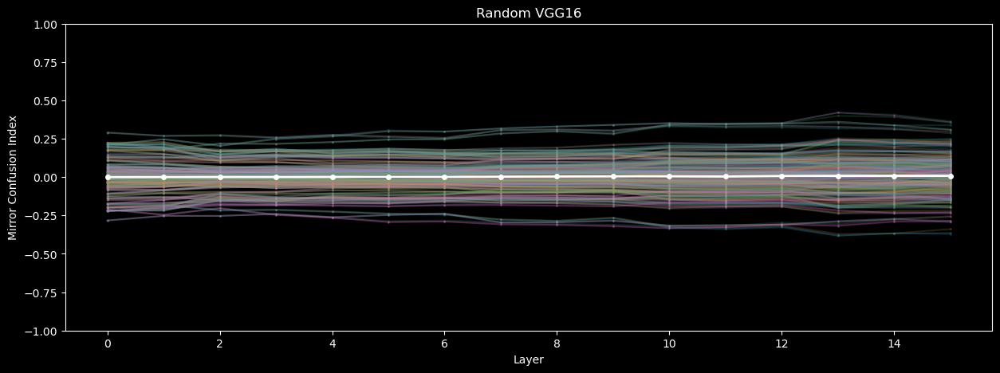

In [10]:
np_rand_vgg16_embeddings = [[e.item() for e in img] for img in rand_vgg16_embeddings]
np_rand_vgg16_mean = np.mean(np_rand_vgg16_embeddings, axis=0)
plt.figure(figsize=(15, 5))
for i in range(num_images):
    color = sns.color_palette("husl", 8)[i % 8] + (0.2,)
    plt.plot(np_rand_vgg16_embeddings[i], color=color, marker='o', markersize=1)
plt.plot(np_rand_vgg16_mean, color='white', marker='o', markersize=4, linewidth=2)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('Random VGG16')
plt.show()


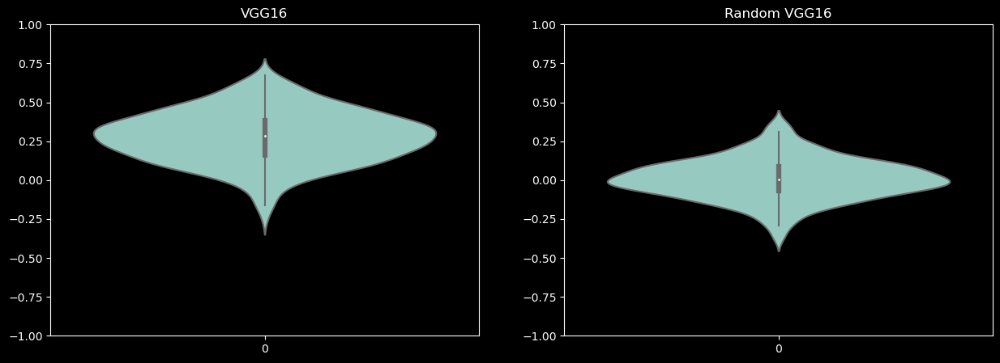

In [11]:
np_vgg16_final_layer = [e[-1].item() for e in vgg16_embeddings]
np_rand_vgg16_final_layer = [e[-1].item() for e in rand_vgg16_embeddings]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.violinplot(np_vgg16_final_layer, ax=ax[0])
ax[0].set_title('VGG16')
ax[0].set_ylim(-1, 1)
sns.violinplot(np_rand_vgg16_final_layer, ax=ax[1])
ax[1].set_title('Random VGG16')
ax[1].set_ylim(-1, 1)
plt.show()

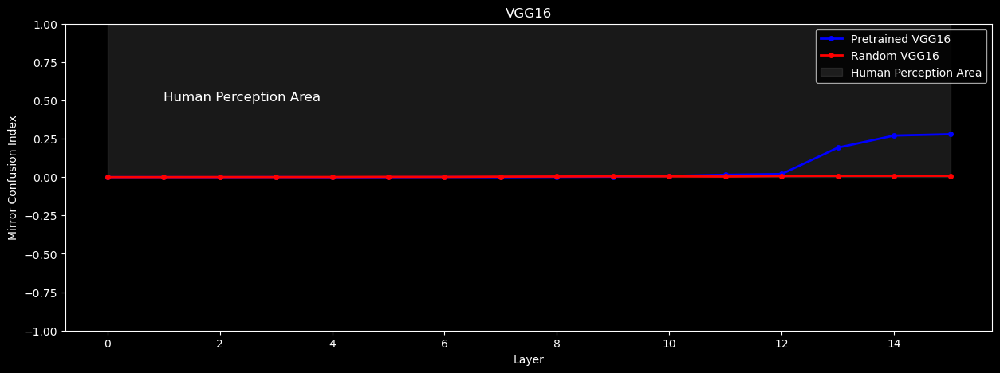

In [39]:
# pretrained vs random
plt.figure(figsize=(15, 5))
plt.plot(np_vgg16_mean, color='blue', marker='o', markersize=4, linewidth=2)
plt.plot(np_rand_vgg16_mean, color='red', marker='o', markersize=4, linewidth=2)
# shade the region y > 0 as human perception area
plt.fill_between(range(len(np_vgg16_mean)), 0, 1, color='gray', alpha=0.2)
plt.text(1, 0.5, 'Human Perception Area', fontsize=12)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('VGG16')
plt.legend(['Pretrained VGG16', 'Random VGG16', 'Human Perception Area'])
plt.show()

In [14]:
print('VGG16')
print('Mean:', np.mean(np_vgg16_final_layer))
print('Std:', np.std(np_vgg16_final_layer))
print('Min:', np.min(np_vgg16_final_layer))
print('Max:', np.max(np_vgg16_final_layer))

print()

print('Random VGG16')
print('Mean:', np.mean(np_rand_vgg16_final_layer))
print('Std:', np.std(np_rand_vgg16_final_layer))
print('Min:', np.min(np_rand_vgg16_final_layer))
print('Max:', np.max(np_rand_vgg16_final_layer))

VGG16
Mean: 0.27926869517813124
Std: 0.16714218342263357
Min: -0.24173714220523834
Max: 0.6731196045875549

Random VGG16
Mean: 0.008427736531060267
Std: 0.130068724402027
Min: -0.37052711844444275
Max: 0.36455097794532776


# Inception

In [19]:
inception = models.inception_v3(pretrained=True)
inception.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
inception.to(device)

preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

inception_embeddings = []
num_images = stimuli.shape[0]

inceptionOutputs = [ 
    inception.Conv2d_1a_3x3,
    inception.Conv2d_2a_3x3,
    inception.Conv2d_2b_3x3,
    inception.maxpool1,
    inception.Conv2d_3b_1x1,
    inception.Conv2d_4a_3x3,
    inception.maxpool2,
    inception.Mixed_5b,
    inception.Mixed_5c,
    inception.Mixed_5d,
    inception.Mixed_6a,
    inception.Mixed_6b,
    inception.Mixed_6c,
    inception.Mixed_6d,
    inception.Mixed_6e,
    inception.Mixed_7a,
    inception.Mixed_7b,
    inception.Mixed_7c,
    inception.avgpool,
    inception.dropout,
    torch.flatten,
    inception.fc,
]

for i in range(num_images):
    inception_embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)


    with torch.no_grad():
        for layer in inceptionOutputs:
            if layer is torch.flatten:
                original_tensor = layer(original_tensor, 1)
                horizontal_tensor = layer(horizontal_tensor, 1)
                vertical_tensor = layer(vertical_tensor, 1)
            else:
                original_tensor = layer(original_tensor)
                horizontal_tensor = layer(horizontal_tensor)
                vertical_tensor = layer(vertical_tensor)
            confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
            inception_embeddings[-1].append(confusion_index)

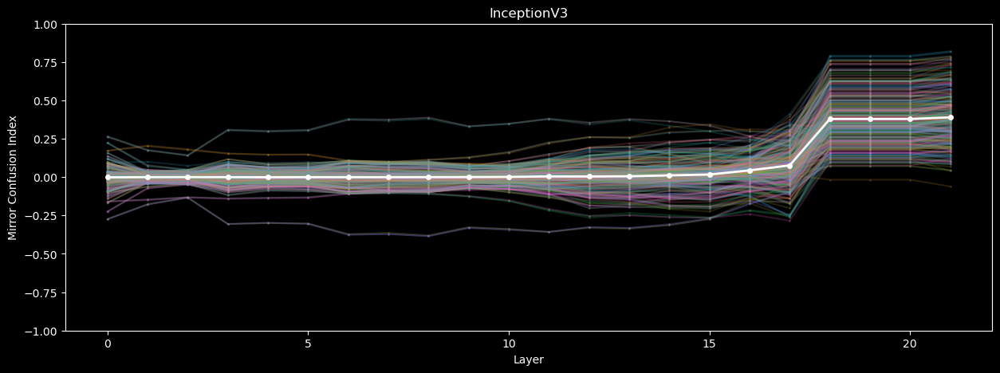

In [20]:
np_inception_embeddings = [[e.item() for e in img] for img in inception_embeddings]
np_inception_mean = np.mean(np_inception_embeddings, axis=0)
plt.figure(figsize=(15, 5))
for i in range(num_images):
    color = sns.color_palette("husl", 8)[i % 8] + (0.2,)
    plt.plot(np_inception_embeddings[i], color=color, marker='o', markersize=1)
plt.plot(np_inception_mean, color='white', marker='o', markersize=4, linewidth=2)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('InceptionV3')
plt.show()

In [24]:
rand_inception = models.inception_v3(pretrained=False)
rand_inception.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
rand_inception.to(device)

rand_inception_embeddings = []
num_images = stimuli.shape[0]

inceptionOutputs = [ 
    rand_inception.Conv2d_1a_3x3,
    rand_inception.Conv2d_2a_3x3,
    rand_inception.Conv2d_2b_3x3,
    rand_inception.maxpool1,
    rand_inception.Conv2d_3b_1x1,
    rand_inception.Conv2d_4a_3x3,
    rand_inception.maxpool2,
    rand_inception.Mixed_5b,
    rand_inception.Mixed_5c,
    rand_inception.Mixed_5d,
    rand_inception.Mixed_6a,
    rand_inception.Mixed_6b,
    rand_inception.Mixed_6c,
    rand_inception.Mixed_6d,
    rand_inception.Mixed_6e,
    rand_inception.Mixed_7a,
    rand_inception.Mixed_7b,
    rand_inception.Mixed_7c,
    rand_inception.avgpool,
    rand_inception.dropout,
    torch.flatten,
    rand_inception.fc,
]

for i in range(num_images):
    rand_inception_embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)


    with torch.no_grad():
        for layer in inceptionOutputs:
            if layer is torch.flatten:
                original_tensor = layer(original_tensor, 1)
                horizontal_tensor = layer(horizontal_tensor, 1)
                vertical_tensor = layer(vertical_tensor, 1)
            else:
                original_tensor = layer(original_tensor)
                horizontal_tensor = layer(horizontal_tensor)
                vertical_tensor = layer(vertical_tensor)
            confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
            rand_inception_embeddings[-1].append(confusion_index)

c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


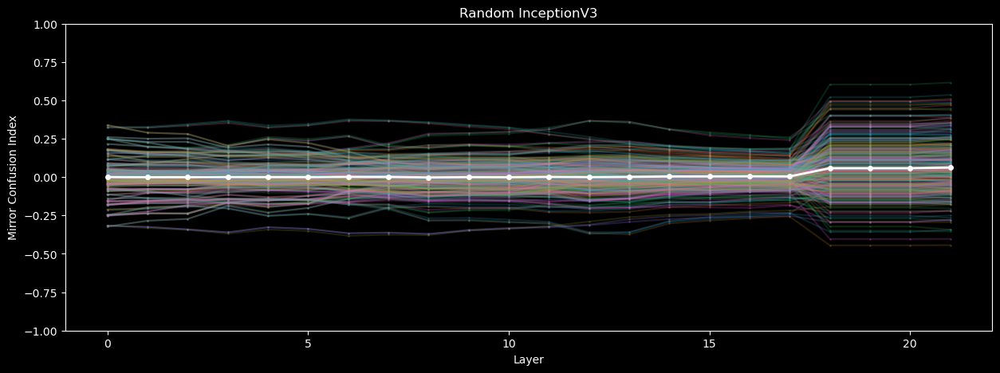

In [25]:
np_rand_inception_embeddings = [[e.item() for e in img] for img in rand_inception_embeddings]
np_rand_inception_mean = np.mean(np_rand_inception_embeddings, axis=0)
plt.figure(figsize=(15, 5))
for i in range(num_images):
    color = sns.color_palette("husl", 8)[i % 8] + (0.2,)
    plt.plot(np_rand_inception_embeddings[i], color=color, marker='o', markersize=1)
plt.plot(np_rand_inception_mean, color='white', marker='o', markersize=4, linewidth=2)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('Random InceptionV3')
plt.show()

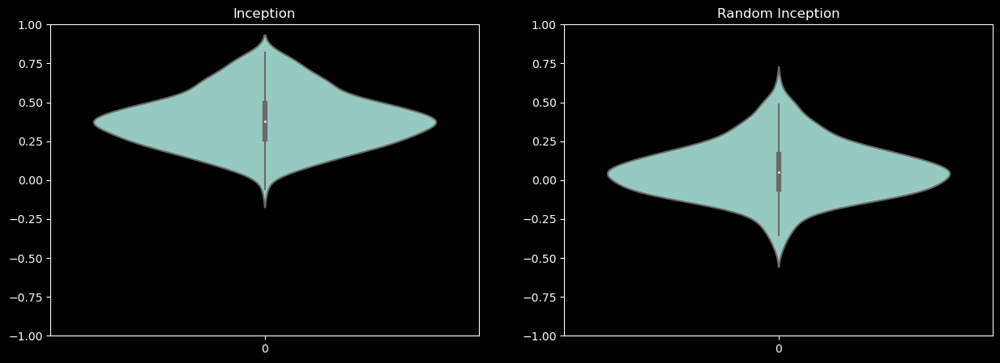

In [26]:
np_inception_final_layer = [e[-1] for e in np_inception_embeddings]
np_rand_inception_final_layer = [e[-1] for e in np_rand_inception_embeddings]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.violinplot(np_inception_final_layer, ax=ax[0])
ax[0].set_title('Inception')
ax[0].set_ylim(-1, 1)
sns.violinplot(np_rand_inception_final_layer, ax=ax[1])
ax[1].set_title('Random Inception')
ax[1].set_ylim(-1, 1)
plt.show()

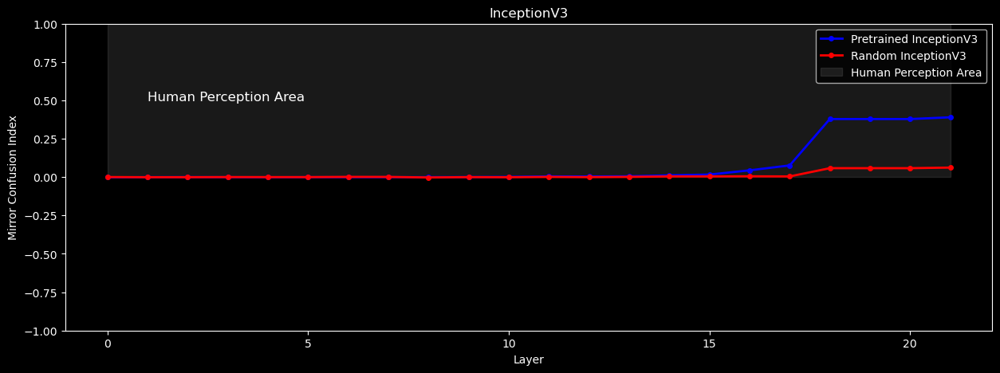

In [40]:
# pretrained vs random
plt.figure(figsize=(15, 5))
plt.plot(np_inception_mean, color='blue', marker='o', markersize=4, linewidth=2)
plt.plot(np_rand_inception_mean, color='red', marker='o', markersize=4, linewidth=2)
# shade the region y > 0 as human perception area
plt.fill_between(range(len(np_inception_mean)), 0, 1, color='gray', alpha=0.2)
plt.text(1, 0.5, 'Human Perception Area', fontsize=12)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('InceptionV3')
plt.legend(['Pretrained InceptionV3', 'Random InceptionV3', 'Human Perception Area'])
plt.show()

In [27]:
print('Inception')
print('Mean:', np.mean(np_inception_final_layer))
print('Std:', np.std(np_inception_final_layer))
print('Min:', np.min(np_inception_final_layer))
print('Max:', np.max(np_inception_final_layer))

print()

print('Random Inception')
print('Mean:', np.mean(np_rand_inception_final_layer))
print('Std:', np.std(np_rand_inception_final_layer))
print('Min:', np.min(np_rand_inception_final_layer))
print('Max:', np.max(np_rand_inception_final_layer))

Inception
Mean: 0.38986941110342743
Std: 0.17386447040299785
Min: -0.0608515702188015
Max: 0.8209753036499023

Random Inception
Mean: 0.06211657637863633
Std: 0.1752190087299089
Min: -0.4434553384780884
Max: 0.6161625385284424


# ResNet

In [28]:
resnet18 = models.resnet18(pretrained=True)
resnet18.eval()

resnetLayers = [
    resnet18.conv1,
    resnet18.bn1,
    resnet18.relu,
    resnet18.maxpool,
    resnet18.layer1,
    resnet18.layer2,
    resnet18.layer3,
    resnet18.layer4,
    resnet18.avgpool,
    torch.flatten,
    resnet18.fc,
]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet18.to(device)

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

resnet18_embeddings = []
num_images = stimuli.shape[0]

for i in range(num_images):
    resnet18_embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)

    with torch.no_grad():
        for layer in resnetLayers:
            if layer is torch.flatten:
                original_tensor = layer(original_tensor, 1)
                horizontal_tensor = layer(horizontal_tensor, 1)
                vertical_tensor = layer(vertical_tensor, 1)
            else:
                original_tensor = layer(original_tensor)
                horizontal_tensor = layer(horizontal_tensor)
                vertical_tensor = layer(vertical_tensor)
            confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
            resnet18_embeddings[-1].append(confusion_index)

c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


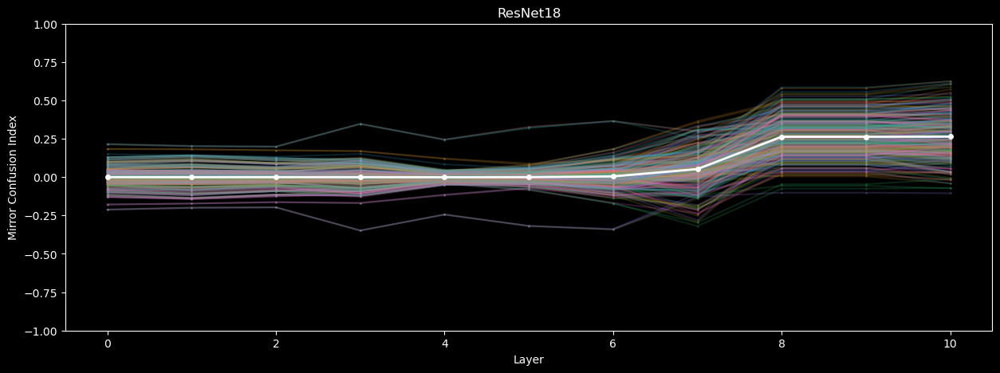

In [29]:
np_resnet18_embeddings = [[e.item() for e in img] for img in resnet18_embeddings]
np_resnet18_mean = np.mean(np_resnet18_embeddings, axis=0)
plt.figure(figsize=(15, 5))
for i in range(num_images):
    color = sns.color_palette("husl", 8)[i % 8] + (0.2,)
    plt.plot(np_resnet18_embeddings[i], color=color, marker='o', markersize=1)
plt.plot(np_resnet18_mean, color='white', marker='o', markersize=4, linewidth=2)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('ResNet18')
plt.show()

In [30]:
rand_resnet18 = models.resnet18(pretrained=False)
rand_resnet18.eval()

rand_resnetLayers = [
    rand_resnet18.conv1,
    rand_resnet18.bn1,
    rand_resnet18.relu,
    rand_resnet18.maxpool,
    rand_resnet18.layer1,
    rand_resnet18.layer2,
    rand_resnet18.layer3,
    rand_resnet18.layer4,
    rand_resnet18.avgpool,
    torch.flatten,
    rand_resnet18.fc,
]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
rand_resnet18.to(device)

rand_resnet18_embeddings = []
num_images = stimuli.shape[0]

for i in range(num_images):
    rand_resnet18_embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)

    with torch.no_grad():
        for layer in rand_resnetLayers:
            if layer is torch.flatten:
                original_tensor = layer(original_tensor, 1)
                horizontal_tensor = layer(horizontal_tensor, 1)
                vertical_tensor = layer(vertical_tensor, 1)
            else:
                original_tensor = layer(original_tensor)
                horizontal_tensor = layer(horizontal_tensor)
                vertical_tensor = layer(vertical_tensor)
            confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
            rand_resnet18_embeddings[-1].append(confusion_index)

c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


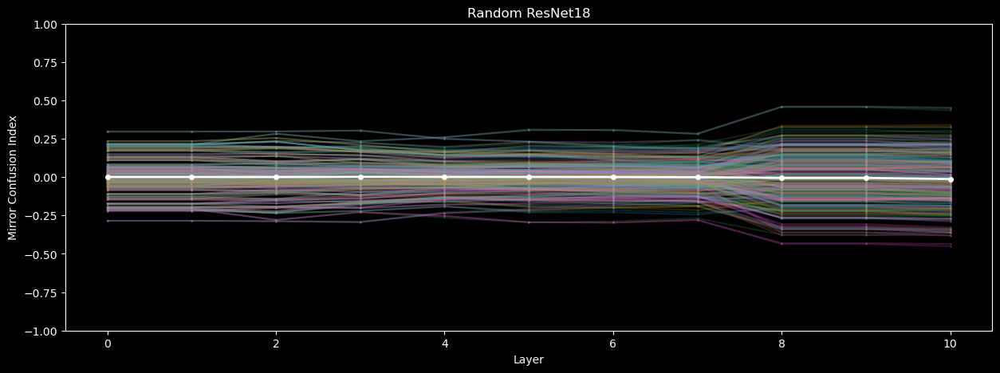

In [31]:
np_rand_resnet18_embeddings = [[e.item() for e in img] for img in rand_resnet18_embeddings]
np_rand_resnet18_mean = np.mean(np_rand_resnet18_embeddings, axis=0)
plt.figure(figsize=(15, 5))
for i in range(num_images):
    color = sns.color_palette("husl", 8)[i % 8] + (0.2,)
    plt.plot(np_rand_resnet18_embeddings[i], color=color, marker='o', markersize=1)
plt.plot(np_rand_resnet18_mean, color='white', marker='o', markersize=4, linewidth=2)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('Random ResNet18')
plt.show()


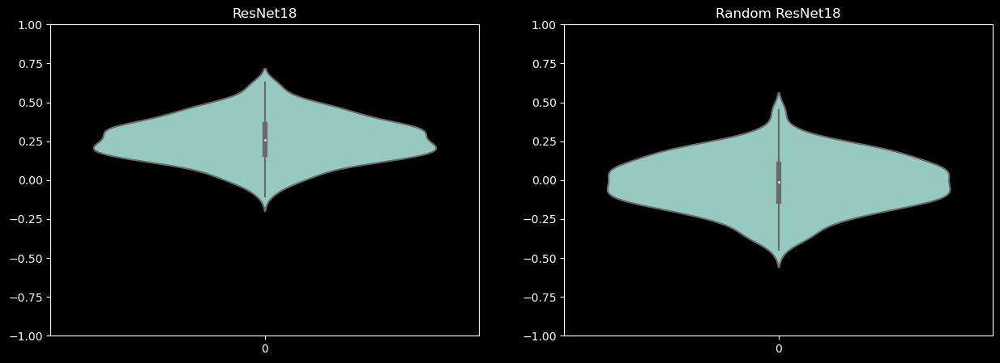

In [32]:
np_resnet18_final_layer = [e[-1] for e in np_resnet18_embeddings]
np_rand_resnet18_final_layer = [e[-1] for e in np_rand_resnet18_embeddings]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.violinplot(np_resnet18_final_layer, ax=ax[0])
ax[0].set_title('ResNet18')
ax[0].set_ylim(-1, 1)
sns.violinplot(np_rand_resnet18_final_layer, ax=ax[1])
ax[1].set_title('Random ResNet18')
ax[1].set_ylim(-1, 1)
plt.show()

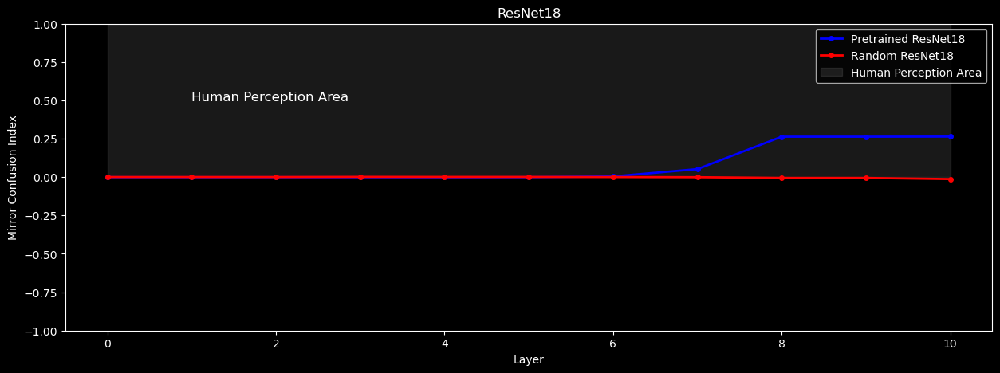

In [41]:
# pretrained vs random
plt.figure(figsize=(15, 5))
plt.plot(np_resnet18_mean, color='blue', marker='o', markersize=4, linewidth=2)
plt.plot(np_rand_resnet18_mean, color='red', marker='o', markersize=4, linewidth=2)
# shade the region y > 0 as human perception area
plt.fill_between(range(len(np_resnet18_mean)), 0, 1, color='gray', alpha=0.2)
plt.text(1, 0.5, 'Human Perception Area', fontsize=12)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('ResNet18')
plt.legend(['Pretrained ResNet18', 'Random ResNet18', 'Human Perception Area'])
plt.show()

In [33]:
print('ResNet18')
print('Mean:', np.mean(np_resnet18_final_layer))
print('Std:', np.std(np_resnet18_final_layer))
print('Min:', np.min(np_resnet18_final_layer))
print('Max:', np.max(np_resnet18_final_layer))

print()

print('Random ResNet18')
print('Mean:', np.mean(np_rand_resnet18_final_layer))
print('Std:', np.std(np_rand_resnet18_final_layer))
print('Min:', np.min(np_rand_resnet18_final_layer))
print('Max:', np.max(np_rand_resnet18_final_layer))

ResNet18
Mean: 0.263932215529494
Std: 0.143050814984814
Min: -0.10528092831373215
Max: 0.6259072422981262

Random ResNet18
Mean: -0.012490302406586124
Std: 0.16834736936253172
Min: -0.4500748813152313
Max: 0.4532981514930725


# VIT

In [40]:
vit_base_patch16_224 = timm.create_model('vit_base_patch16_224', pretrained=True)
vit_base_patch16_224.eval()

vit_base_patch16_224Features = [
    vit_base_patch16_224.patch_embed,
    vit_base_patch16_224._pos_embed,
    vit_base_patch16_224.patch_drop,
    vit_base_patch16_224.norm_pre
]

vit_base_patch16_224Head = [
    vit_base_patch16_224.fc_norm,
    vit_base_patch16_224.head_drop,
    vit_base_patch16_224.head
]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vit_base_patch16_224.to(device)


preprocess = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

vit_base_patch16_224_embeddings = []
num_images = stimuli.shape[0]

for i in range(num_images):
    vit_base_patch16_224_embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)

    with torch.no_grad():
        for layer in vit_base_patch16_224Features:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)

        for layer in vit_base_patch16_224.blocks:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)
            confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
            vit_base_patch16_224_embeddings[-1].append(confusion_index)

        original_tensor = vit_base_patch16_224.norm(original_tensor)
        horizontal_tensor = vit_base_patch16_224.norm(horizontal_tensor)
        vertical_tensor = vit_base_patch16_224.norm(vertical_tensor)
        confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
        vit_base_patch16_224_embeddings[-1].append(confusion_index)

        original_tensor = original_tensor[:, 0]
        horizontal_tensor = horizontal_tensor[:, 0]
        vertical_tensor = vertical_tensor[:, 0]

        for layer in vit_base_patch16_224Head:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)
            confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
            vit_base_patch16_224_embeddings[-1].append(confusion_index)

In [34]:
print(vit_base_patch16_224.blocks)

Block(
  (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (attn): Attention(
    (qkv): Linear(in_features=768, out_features=2304, bias=True)
    (q_norm): Identity()
    (k_norm): Identity()
    (attn_drop): Dropout(p=0.0, inplace=False)
    (proj): Linear(in_features=768, out_features=768, bias=True)
    (proj_drop): Dropout(p=0.0, inplace=False)
  )
  (ls1): Identity()
  (drop_path1): Identity()
  (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (mlp): Mlp(
    (fc1): Linear(in_features=768, out_features=3072, bias=True)
    (act): GELU(approximate='none')
    (drop1): Dropout(p=0.0, inplace=False)
    (norm): Identity()
    (fc2): Linear(in_features=3072, out_features=768, bias=True)
    (drop2): Dropout(p=0.0, inplace=False)
  )
  (ls2): Identity()
  (drop_path2): Identity()
)


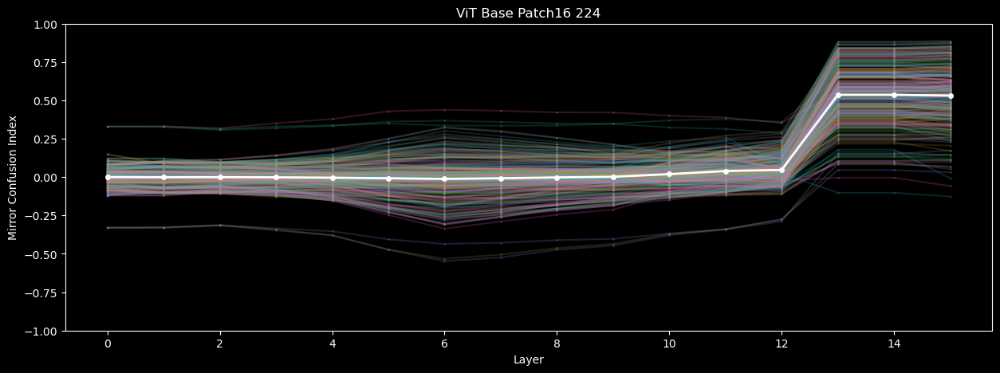

In [41]:
np_vit_base_patch16_224_embeddings = [[e.item() for e in img] for img in vit_base_patch16_224_embeddings]
np_vit_base_patch16_224_mean = np.mean(np_vit_base_patch16_224_embeddings, axis=0)
plt.figure(figsize=(15, 5))
for i in range(num_images):
    color = sns.color_palette("husl", 8)[i % 8] + (0.2,)
    plt.plot(np_vit_base_patch16_224_embeddings[i], color=color, marker='o', markersize=1)
plt.plot(np_vit_base_patch16_224_mean, color='white', marker='o', markersize=4, linewidth=2)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('ViT Base Patch16 224')
plt.show()


In [42]:
rand_vit_base_patch16_224 = timm.create_model('vit_base_patch16_224', pretrained=False)
rand_vit_base_patch16_224.eval()

rand_vit_base_patch16_224Features = [
    rand_vit_base_patch16_224.patch_embed,
    rand_vit_base_patch16_224._pos_embed,
    rand_vit_base_patch16_224.patch_drop,
    rand_vit_base_patch16_224.norm_pre
]

rand_vit_base_patch16_224Head = [
    rand_vit_base_patch16_224.fc_norm,
    rand_vit_base_patch16_224.head_drop,
    rand_vit_base_patch16_224.head
]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
rand_vit_base_patch16_224.to(device)

rand_vit_base_patch16_224_embeddings = []
num_images = stimuli.shape[0]

for i in range(num_images):
    rand_vit_base_patch16_224_embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)

    with torch.no_grad():
        for layer in rand_vit_base_patch16_224Features:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)

        for layer in rand_vit_base_patch16_224.blocks:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)
            confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
            rand_vit_base_patch16_224_embeddings[-1].append(confusion_index)

        original_tensor = rand_vit_base_patch16_224.norm(original_tensor)
        horizontal_tensor = rand_vit_base_patch16_224.norm(horizontal_tensor)
        vertical_tensor = rand_vit_base_patch16_224.norm(vertical_tensor)
        confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
        rand_vit_base_patch16_224_embeddings[-1].append(confusion_index)

        original_tensor = original_tensor[:, 0]
        horizontal_tensor = horizontal_tensor[:, 0]
        vertical_tensor = vertical_tensor[:, 0]

        for layer in rand_vit_base_patch16_224Head:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)
            confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
            rand_vit_base_patch16_224_embeddings[-1].append(confusion_index)

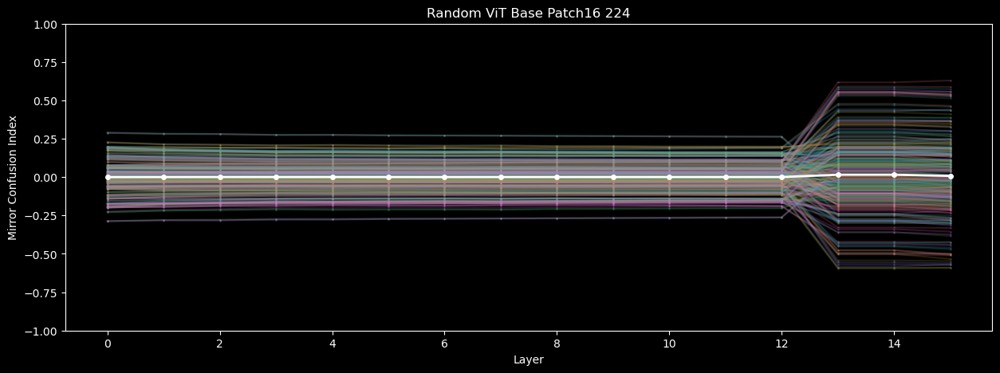

In [43]:
np_rand_vit_base_patch16_224_embeddings = [[e.item() for e in img] for img in rand_vit_base_patch16_224_embeddings]
np_rand_vit_base_patch16_224_mean = np.mean(np_rand_vit_base_patch16_224_embeddings, axis=0)
plt.figure(figsize=(15, 5))
for i in range(num_images):
    color = sns.color_palette("husl", 8)[i % 8] + (0.2,)
    plt.plot(np_rand_vit_base_patch16_224_embeddings[i], color=color, marker='o', markersize=1)
plt.plot(np_rand_vit_base_patch16_224_mean, color='white', marker='o', markersize=4, linewidth=2)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('Random ViT Base Patch16 224')
plt.show()


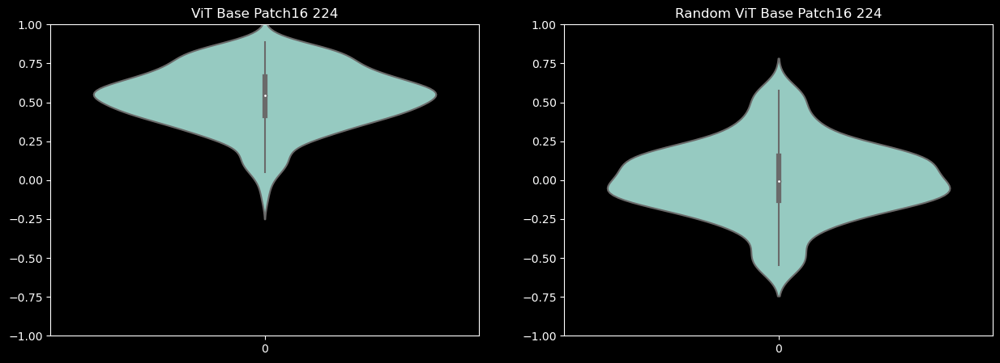

In [44]:
np_vit_base_patch16_224_final_layer = [e[-1] for e in np_vit_base_patch16_224_embeddings]
np_rand_vit_base_patch16_224_final_layer = [e[-1] for e in np_rand_vit_base_patch16_224_embeddings]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.violinplot(np_vit_base_patch16_224_final_layer, ax=ax[0])
ax[0].set_title('ViT Base Patch16 224')
ax[0].set_ylim(-1, 1)
sns.violinplot(np_rand_vit_base_patch16_224_final_layer, ax=ax[1])
ax[1].set_title('Random ViT Base Patch16 224')
ax[1].set_ylim(-1, 1)
plt.show()

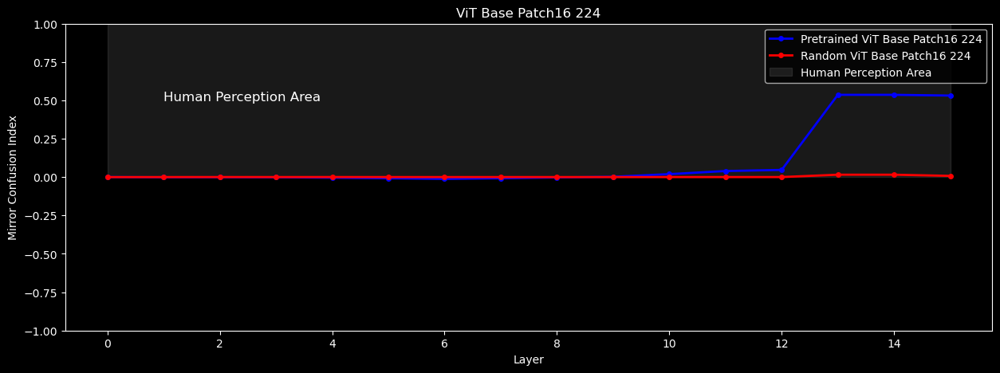

In [46]:
# pretrained vs random
plt.figure(figsize=(15, 5))
plt.plot(np_vit_base_patch16_224_mean, color='blue', marker='o', markersize=4, linewidth=2)
plt.plot(np_rand_vit_base_patch16_224_mean, color='red', marker='o', markersize=4, linewidth=2)
# shade the region y > 0 as human perception area
plt.fill_between(range(len(np_vit_base_patch16_224_mean)), 0, 1, color='gray', alpha=0.2)
plt.text(1, 0.5, 'Human Perception Area', fontsize=12)
plt.ylim(-1, 1)
plt.xlabel('Layer')
plt.ylabel('Mirror Confusion Index')
plt.title('ViT Base Patch16 224')
plt.legend(['Pretrained ViT Base Patch16 224', 'Random ViT Base Patch16 224', 'Human Perception Area'])
plt.show()

In [45]:
print('ViT Base Patch16 224')
print('Mean:', np.mean(np_vit_base_patch16_224_final_layer))
print('Std:', np.std(np_vit_base_patch16_224_final_layer))
print('Min:', np.min(np_vit_base_patch16_224_final_layer))
print('Max:', np.max(np_vit_base_patch16_224_final_layer))

print()

print('Random ViT Base Patch16 224')
print('Mean:', np.mean(np_rand_vit_base_patch16_224_final_layer))
print('Std:', np.std(np_rand_vit_base_patch16_224_final_layer))
print('Min:', np.min(np_rand_vit_base_patch16_224_final_layer))
print('Max:', np.max(np_rand_vit_base_patch16_224_final_layer))

ViT Base Patch16 224
Mean: 0.5315290574915708
Std: 0.19275355489550922
Min: -0.12615233659744263
Max: 0.8867035508155823

Random ViT Base Patch16 224
Mean: 0.00806044635673364
Std: 0.23992606070348044
Min: -0.5909983515739441
Max: 0.6296125650405884
